In [1]:
using DynamicalSystems, Plots, StatsBase, LaTeXStrings, Distributions, Statistics
include("../src/KoopmanCausality.jl")
using .KoopmanCausality

In [2]:
function roessler_confounder(u,p,t)
    ω1, ω2, ω3, a, b, c, k12, k13 = p

    du1 = -ω1*u[2] - u[3]
    du2 = ω1*u[1] + a*u[2] #+ k21*(u[5]-u[2])
    du3 = b + u[3]*(u[1]-c)
    
    du4 = -ω2*u[5] - u[6]
    du5 = ω2*u[4] + a*u[5] + k12*(u[2]-u[5])
    du6 = b + u[6]*(u[4]-c)
    
    du7 = -ω3*u[8] - u[9]
    du8 = ω3*u[7] + a*u[8] + k13*(u[2]-u[8])
    du9 = b + u[9]*(u[7]-c)
    return SVector(du1,du2,du3,du4,du5,du6,du7,du8,du9)
end

roessler_confounder (generic function with 1 method)

In [3]:
"""
Three coupled Rosslers with 1->2, 1-3, and 3->2
"""
function roessler_confounder_collider(u,p,t)
    ω1, ω2, ω3, a, b, c, k132, k13 = p

    du1 = -ω1*u[2] - u[3]
    du2 = ω1*u[1] + a*u[2] 
    du3 = b + u[3]*(u[1]-c)
    
    du4 = -ω2*u[5] - u[6]
    du5 = ω2*u[4] + a*u[5] + k132*(0.5*(u[2]+u[8])-u[5])
    du6 = b + u[6]*(u[4]-c)
    
    du7 = -ω3*u[8] - u[9]
    du8 = ω3*u[7] + a*u[8] + k13*(u[2]-u[8])
    du9 = b + u[9]*(u[7]-c)
    return SVector(du1,du2,du3,du4,du5,du6,du7,du8,du9)
end

roessler_confounder_collider

### spurrious correlations from confounder

In [5]:
ω1 = 0.8
ω2 = 0.5
ω3 = 0.5
a = 0.2
b = 0.2
c = 5.3
k12 = 0.2
k13 = 0.5

u0=[1, -2, 0, 0.11, 0.2, 0.1, -0.11, 0.3, 0.0]
p = (ω1,ω2,ω3,a,b,c,k12,k13)
ds = CoupledODEs(roessler_confounder, u0, p)
T_evolv = 100.0
time_step = 0.01
transient_time = 2_000.0
orbit, t = trajectory(ds, T_evolv; Δt=time_step, Ttr=transient_time)
data = permutedims(Matrix(orbit))
size(data)

(9, 10001)

In [6]:
times = 11:1:5_000
L = length(times)
x_12_cors = Vector{Float64}(undef, L)
y_12_cors = Vector{Float64}(undef, L)
x_13_cors = Vector{Float64}(undef, L)
y_13_cors = Vector{Float64}(undef, L)
x_23_cors = Vector{Float64}(undef, L)
y_23_cors = Vector{Float64}(undef, L)

u0=[1, -2, 0, 0.11, 0.2, 0.1, -0.11, 0.3, 0.0]
p = (ω1,ω2,ω3,a,b,c,k12,k13)
ds = CoupledODEs(roessler_confounder, u0, p)
time_step = 0.01
transient_time = 1_000.0

for (n, time_evolve) in enumerate(times)
    orbit, t = trajectory(ds, time_evolve; Δt=time_step, Ttr=transient_time)
    data = permutedims(Matrix(orbit))
    x_12_cors[n] = cor(data[1, :], data[4, :])
    y_12_cors[n] = cor(data[2, :], data[5, :])
    x_13_cors[n] = cor(data[1, :], data[7, :])
    y_13_cors[n] = cor(data[2, :], data[8, :])
    x_23_cors[n] = cor(data[4, :], data[7, :])
    y_23_cors[n] = cor(data[5, :], data[8, :]) 
end

correlations as a function of window size used to collect stats

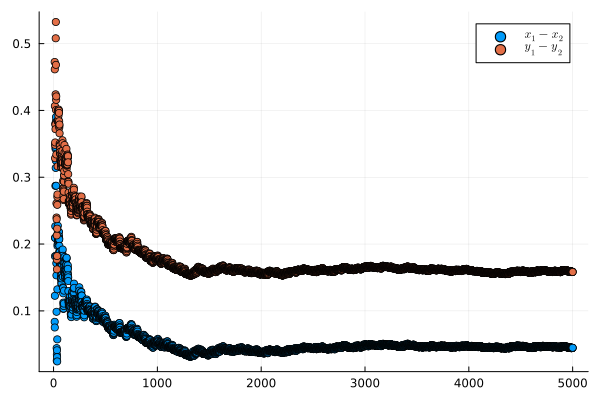

In [7]:
Plots.scatter(times, x_12_cors; label=L"x_1 - x_2")
Plots.scatter!(times, y_12_cors; label=L"y_1 - y_2")

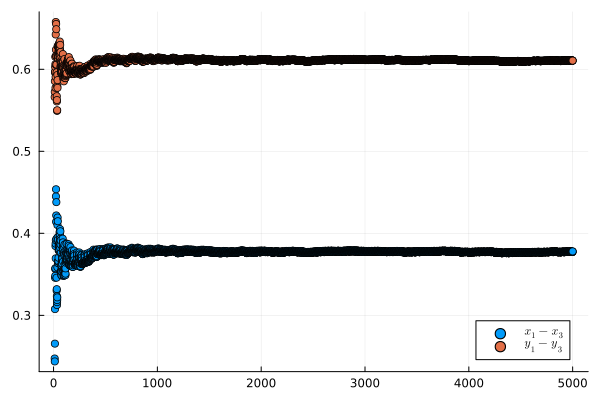

In [8]:
Plots.scatter(times, x_13_cors; label=L"x_1 - x_3")
Plots.scatter!(times, y_13_cors; label=L"y_1 - y_3")

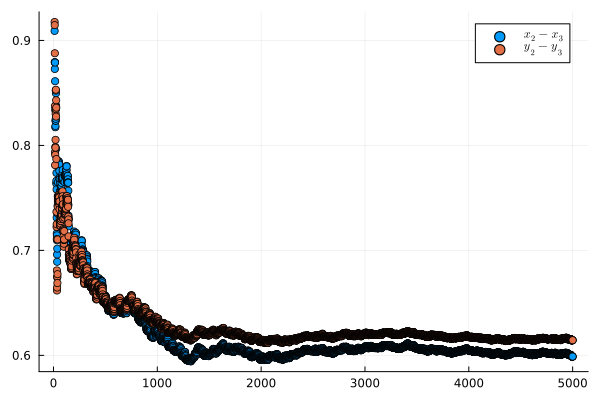

In [9]:
Plots.scatter(times, x_23_cors; label=L"x_2 - x_3")
Plots.scatter!(times, y_23_cors; label=L"y_2 - y_3")

## Koopman causality for symmetrically-coupled Rossler confounder

In [11]:
ω1 = 0.8
ω2 = 0.5
ω3 = 0.5
a = 0.2
b = 0.2
c = 5.3
k12 = 0.5
k13 = 0.5

u0=[1, -2, 0, 0.11, 0.2, 0.1, -0.11, 0.3, 0.0]
p = (ω1,ω2,ω3,a,b,c,k12,k13)
ds = CoupledODEs(roessler_confounder, u0, p)
T_evolve = 8_000.0
time_step = 0.01
transient_time = 1_000.0
orbit, t = trajectory(ds, T_evolve; Δt=time_step, Ttr=transient_time)
data = permutedims(Matrix(orbit))
T = size(data, 2)

800001

In [24]:
# Δ = 500
Δ = 1_000
split = 20_000

Xtot = Array{Float32}(undef, 9, T-Δ)
Ytot = Array{Float32}(undef, 9, T-Δ)

for t in 1:(T-Δ)
    Xtot[:, t] = data[:, t]
    Ytot[:, t] = data[:, t+Δ]
end

X = Xtot[:, 1:end-split]
Y = Ytot[:, 1:end-split]
Xtest = Xtot[:, end-split+1:end]
Ytest = Ytot[:, end-split+1:end];

In [25]:
Nfeats = 150
σs = [2.0, 1.0, 0.5, 0.25, 0.1, 0.05, 0.01, 0.005, 0.001]
N_samples = 5;

1 -> 2

In [26]:
Xe = X[4:6, :]
Ye = Y[4:6, :]
Xteste = Xtest[4:6, :]
Yteste = Ytest[4:6, :]

Xc = X[1:3, :]
Yc = Y[1:3, :]
Xtestc = Xtest[1:3, :]
Ytestc = Ytest[1:3, :]

kcause = RFF_koopman_causality(Xe, Xc, Ye, Xteste, Xtestc, Yteste, Nfeats, σs, N_samples)
L"\omega_1 \rightarrow \omega_2: \; %$kcause"

L"$\omega_1 \rightarrow \omega_2: \; 1.27669235066676$"

1 -> 3

In [27]:
Xe = X[7:end, :]
Ye = Y[7:end, :]
Xteste = Xtest[7:end, :]
Yteste = Ytest[7:end, :]

Xc = X[1:3, :]
Yc = Y[1:3, :]
Xtestc = Xtest[1:3, :]
Ytestc = Ytest[1:3, :];

kcause = RFF_koopman_causality(Xe, Xc, Ye, Xteste, Xtestc, Yteste, Nfeats, σs, N_samples)
L"\omega_1 \rightarrow \omega_3: \; %$kcause"

L"$\omega_1 \rightarrow \omega_3: \; 1.2860687362146963$"

2 -> 3

In [28]:
Xe = X[7:end, :]
Ye = Y[7:end, :]
Xteste = Xtest[7:end, :]
Yteste = Ytest[7:end, :]

Xc = X[4:6, :]
Yc = Y[4:6, :]
Xtestc = Xtest[4:6, :]
Ytestc = Ytest[4:6, :]

kcause = RFF_koopman_causality(Xe, Xc, Ye, Xteste, Xtestc, Yteste, Nfeats, σs, N_samples)
L"\omega_2 \rightarrow \omega_3: \; %$kcause"

L"$\omega_2 \rightarrow \omega_3: \; -0.011725374685424672$"

3 -> 2

In [29]:
Xe = X[4:6, :]
Ye = Y[4:6, :]
Xteste = Xtest[4:6, :]
Yteste = Ytest[4:6, :]

Xc = X[7:end, :]
Yc = Y[7:end, :]
Xtestc = Xtest[7:end, :]
Ytestc = Ytest[7:end, :]

kcause = RFF_koopman_causality(Xe, Xc, Ye, Xteste, Xtestc, Yteste, Nfeats, σs, N_samples)
L"\omega_3 \rightarrow \omega_2: \; %$kcause"

L"$\omega_3 \rightarrow \omega_2: \; -0.06864303040237996$"

In [11]:
begin
    ω1 = 0.8
    ω2 = 0.5
    ω3 = 0.5
    a = 0.2
    b = 0.2
    c = 5.3
    k12 = 0.5
    k13 = 0.5
    
    u0=[1, -2, 0, 0.11, 0.2, 0.1, -0.11, 0.3, 0.0]
    p = (ω1,ω2,ω3,a,b,c,k12,k13)
    ds = CoupledODEs(roessler_confounder, u0, p)
    T_evolve = 8_000.0
    time_step = 0.01
    transient_time = 1_000.0
    orbit, t = trajectory(ds, T_evolve; Δt=time_step, Ttr=transient_time)
    data = permutedims(Matrix(orbit))
    T = size(data, 2)
end

800001

In [24]:
begin
    Δ = 1_000
    sp = 20_000
    
    Xtot = Array{Float32}(undef, 9, T-Δ)
    Ytot = Array{Float32}(undef, 9, T-Δ)
    
    for t in 1:(T-Δ)
        Xtot[:, t] = data[:, t]
        Ytot[:, t] = data[:, t+Δ]
    end
    
    X = Xtot[:, 1:end-sp]
    Y = Ytot[:, 1:end-sp]
    Xtest = Xtot[:, end-sp+1:end]
    Ytest = Ytot[:, end-sp+1:end]
end

In [79]:
begin
    Nfeats = 150
    σs = [2.0, 1.0, 0.5, 0.1, 0.05, 0.01, 0.005, 0.001]
    N_samples = 5
end

5

1 -> 2

In [ ]:
begin 
    using DynamicalSystems, Plots, StatsBase, LaTeXStrings, Distributions, Statistics
    include("../src/KoopmanCausality.jl")
    using .KoopmanCausality

    function roessler_confounder(u,p,t)
        ω1, ω2, ω3, a, b, c, k12, k13 = p
    
        du1 = -ω1*u[2] - u[3]
        du2 = ω1*u[1] + a*u[2] #+ k21*(u[5]-u[2])
        du3 = b + u[3]*(u[1]-c)
        
        du4 = -ω2*u[5] - u[6]
        du5 = ω2*u[4] + a*u[5] + k12*(u[2]-u[5])
        du6 = b + u[6]*(u[4]-c)
        
        du7 = -ω3*u[8] - u[9]
        du8 = ω3*u[7] + a*u[8] + k13*(u[2]-u[8])
        du9 = b + u[9]*(u[7]-c)
        return SVector(du1,du2,du3,du4,du5,du6,du7,du8,du9)
    end

    ω1 = 0.8
    ω2 = 0.5
    ω3 = 0.5
    a = 0.2
    b = 0.2
    c = 5.3
    k12 = 0.5
    k13 = 0.5
    
    u0=[1, -2, 0, 0.11, 0.2, 0.1, -0.11, 0.3, 0.0]
    p = (ω1,ω2,ω3,a,b,c,k12,k13)
    ds = CoupledODEs(roessler_confounder, u0, p)
    T_evolve = 8_000.0
    time_step = 0.01
    transient_time = 1_000.0
    orbit, t = trajectory(ds, T_evolve; Δt=time_step, Ttr=transient_time)
    data = permutedims(Matrix(orbit))
    T = size(data, 2)

    Δ = 1_000
    sp = 20_000
    
    Xtot = Array{Float32}(undef, 9, T-Δ)
    Ytot = Array{Float32}(undef, 9, T-Δ)
    
    for t in 1:(T-Δ)
        Xtot[:, t] = data[:, t]
        Ytot[:, t] = data[:, t+Δ]
    end
    
    X = Xtot[:, 1:end-sp]
    Y = Ytot[:, 1:end-sp]
    Xtest = Xtot[:, end-sp+1:end]
    Ytest = Ytot[:, end-sp+1:end]

    Nfeats = 150
    σs = rand(0.001:0.001:1, 12)
    N_samples = 5
end

In [98]:
rand(10)

10-element Vector{Float64}:
 0.7154683072878272
 0.2785294906269764
 0.3505058773993053
 0.4913711561945969
 0.0852968398190802
 0.34024775110552097
 0.5928071208730145
 0.34432101308751095
 0.49105159846767055
 0.027771254333714745

In [26]:
@time begin
    Xe = X[4:6, :]
    Ye = Y[4:6, :]
    Xteste = Xtest[4:6, :]
    Yteste = Ytest[4:6, :]
    
    Xc = X[1:3, :]
    Yc = Y[1:3, :]
    Xtestc = Xtest[1:3, :]
    Ytestc = Ytest[1:3, :]

    kcause = RFF_koopman_causality_v1(Xe, Xc, Ye, Xteste, Xtestc, Yteste, Nfeats, σs, N_samples; parallel=true)
    L"\omega_1 \rightarrow \omega_2: \; %$kcause"
end

L"$\omega_1 \rightarrow \omega_2: \; 1.27669235066676$"

1 -> 3

In [27]:
Xe = X[7:end, :]
Ye = Y[7:end, :]
Xteste = Xtest[7:end, :]
Yteste = Ytest[7:end, :]

Xc = X[1:3, :]
Yc = Y[1:3, :]
Xtestc = Xtest[1:3, :]
Ytestc = Ytest[1:3, :];

kcause = RFF_koopman_causality(Xe, Xc, Ye, Xteste, Xtestc, Yteste, Nfeats, σs, N_samples)
L"\omega_1 \rightarrow \omega_3: \; %$kcause"

L"$\omega_1 \rightarrow \omega_3: \; 1.2860687362146963$"

2 -> 3

In [28]:
@time begin
    Xe = X[7:end, :]
    Ye = Y[7:end, :]
    Xteste = Xtest[7:end, :]
    Yteste = Ytest[7:end, :]
    
    Xc = X[4:6, :]
    Yc = Y[4:6, :]
    Xtestc = Xtest[4:6, :]
    Ytestc = Ytest[4:6, :]
    
    kcause = RFF_koopman_causality_v1(Xe, Xc, Ye, Xteste, Xtestc, Yteste, Nfeats, σs, N_samples; parallel=true)
    L"\omega_2 \rightarrow \omega_3: \; %$kcause"
end

L"$\omega_2 \rightarrow \omega_3: \; -0.011725374685424672$"

3 -> 2

In [29]:
Xe = X[4:6, :]
Ye = Y[4:6, :]
Xteste = Xtest[4:6, :]
Yteste = Ytest[4:6, :]

Xc = X[7:end, :]
Yc = Y[7:end, :]
Xtestc = Xtest[7:end, :]
Ytestc = Ytest[7:end, :]

kcause = RFF_koopman_causality(Xe, Xc, Ye, Xteste, Xtestc, Yteste, Nfeats, σs, N_samples)
L"\omega_3 \rightarrow \omega_2: \; %$kcause"

L"$\omega_3 \rightarrow \omega_2: \; -0.06864303040237996$"